<a href="https://colab.research.google.com/github/tomaszsmaruj25/Cup_class_detection/blob/main/Final_Train_TF2_detection_Zoo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tensorflow 2 Object Detection: Train model

---





The notebook is part of my thesis "Intelligent vision system for product quality control". For more information and check how system is working on Raspberry PI visit my github. 
The code below was created using the notebook provided by TannerGilbert. The TF environment was changed for the purposes of the Raspberry PI model and adapted to the own database. 
<table align="left"><td>
  <a target="_blank"  href="https://github.com/tomaszsmaruj25/Cup_class_detection">
    <img width=32px src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
</td>
<td><a target="_blank"  href="https://colab.research.google.com/github/TannerGilbert/Tensorflow-Object-Detection-API-Train-Model/blob/master/Tensorflow_2_Object_Detection_Train_model.ipynb">
    <img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Go to source code from Tanner Gilbert</a></td>
</table>

This notebook walks you through training a custom object detection model using the Tensorflow Object Detection API and Tensorflow 2.

The notebook is split into the following parts:
* Install the Tensorflow Object Detection API
* Prepare data for use with the OD API
* Write custom training configuration
* Train detector
* Export model inference graph and conversion into .tflite file
* Test trained model

The results below:
![Microcontroller Detection](https://raw.githubusercontent.com/tomaszsmaruj25/Cup_class_detection/main/assets/unclean_detection.PNG)

## Installation TF2

Here is the installing the Tensorflow Object Detection API part. The following few cells are all that is needed in order to install the OD API.

In [ ]:
!pip install -U --pre tensorflow=="2.6.0"

In [ ]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 2921, done.
remote: Counting objects: 100% (2921/2921), done.
remote: Compressing objects: 100% (2450/2450), done.
remote: Total 2921 (delta 741), reused 1270 (delta 433), pack-reused 0
Receiving objects: 100% (2921/2921), 32.97 MiB | 19.53 MiB/s, done.
Resolving deltas: 100% (741/741), done.


In [ ]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1665422 sha256=8dc4aa2a847a08da782108851ec5a9d061b08e335ab792f9d9bd5c5669f16b49
  Stored in directory: /tmp/pip-ephem-wheel-cache-ylh84wfp/wheels/fa/a4/d2/e9a5057e414fd46c8e543d2706cd836d64e1fcd9eccceb2329
  Created wheel for py-cpuinfo: filename=py_cpuinfo-8.0.0-py3-none-any.whl size=22258 sha256=0af8915c6c22cbc63dcffcc13ab54c6152ef7f6f51a6464ac35ef66fb2583e3f
  Stored in directory: /root/.cache/pip/wheels/d2/f1/1f/041add21dc9c4220157f1bd2bd6afe1f1a49524c3396b94401
  Created wheel for avro-python3: filename=avro_python3-1.9.2.1-py3-none-any.whl size=43512 sha256=3b40ae41cfd47399afe1f46e3af2518e142cb51c80aa3d86aa77d16426fa82d8
  Stored in directory: /root/.cache/pip/wheels/bc/49/5f/fdb5b9d85055c478213e0158ac122b596816149a02d82e0ab1
  Created wheel for dill: filename=dill-0.3.1.1-py3-none-any.whl size=78546 sha256=70a51342e2a95f12b7b887ebe3fdac529bd4ec8669e75cfd7

  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
multiprocess 0.70.12.2 requires dill>=0.3.4, but you have dill 0.3.1.1 which is incompatible.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


In [ ]:
#run model builder test
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

2021-09-20 09:40:46.933398: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-20 09:40:47.352732: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-20 09:40:47.353667: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
Running tests under Python 3.7.12: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2021-09-20 09:40:47.374339: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021

## Prepare data

To train a model, you need a lot of pictures that vary greatly from each other. In this project, photos were taken individually for each class under the given lighting conditions and on the same background. 

After collecting the images I need to label them. For this purpose I used [RoboFlow page](https://roboflow.com/). It is a very useful tool that allows you to upload, select photos, create datasets and export them in a simple, fast and intuitive way. 

First, create a free account and upload the photos you want to select.
Then we can add for each of them new label, and save it in dataset.  
![LabelImg](https://raw.githubusercontent.com/tomaszsmaruj25/Cup_class_detection/main/assets/roboflow_labels.png)

The interface will guide us through the next steps and will allow us to generate a link with a package of .zip photos in the format we are interested in. In my case it is the tensorflow format 


In [ ]:
# HERE CODE FROM ROBOFLOW

#Dataset v1
!curl -L "INSERT PATH TO THE DATASET HERE" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   891  100   891    0     0   1453      0 --:--:-- --:--:-- --:--:--  1453
100 1567k  100 1567k    0     0  1365k      0  0:00:01  0:00:01 --:--:-- 4749k
Archive:  roboflow.zip
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/cc3.tfrecord       
 extracting: test/cc3_label_map.pbtxt  
   creating: train/
 extracting: train/cc3.tfrecord      
 extracting: train/cc3_label_map.pbtxt  


### Save path for each data file

In [ ]:
train_record_path = '/content/train/cc3.tfrecord'
test_record_path = '/content/test/cc3.tfrecord'
labelmap_path = '/content/test/cc3_label_map.pbtxt'

## Configuring training

Now that the data is ready it's time to create a training configuration. The OD API supports lots of models, each with its own config file. We need to select which model we will use and configure it for our environment.

### Select pretrained the model
Models are available from Tensorflow Github:
[TF1 Detection Model Zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf1_detection_zoo.md) or 
[TF2 Detection Model Zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md).

In [ ]:
# --------------------------------------------------------------------------------------
# DOWNLOAD AND UNZIP SELECTED MODELS FROM TF2 DETECTION ZOO
# --------------------------------------------------------------------------------------

# Efficientdet_d0_coco17 - PROBLEM WITH TRAINING
# !wget http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
# !tar -xf efficientdet_d0_coco17_tpu-32.tar.gz

# SSD_mobilenet_v2_fpnlite
# !wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz
# !tar -xf ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz

# SSD MobileNet V2 FPNLite 320x320
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
!tar -xf  ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz


--2021-09-20 09:41:27--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.133.128, 2a00:1450:400c:c07::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.133.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20515344 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.56M  25.4MB/s    in 0.8s    

2021-09-20 09:41:28 (25.4 MB/s) - ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’ saved [20515344/20515344]



For every model from Model Detection ZOO it is mandatory to select a config file. 

List with the names of configs file is available here: [TF1 Configs](https://github.com/tensorflow/models/tree/master/research/object_detection/samples/configs) or 
[TF2 Configs](https://github.com/tensorflow/models/tree/master/research/object_detection/configs/tf2).

In [ ]:
# --------------------------------------------------------------------------------------
# SET PATH AND CONFIGS FOR SELECTED MODELS FROM TF2 DETECTION ZOO
# --------------------------------------------------------------------------------------

# Efficientdet_d0_coco17 512x512 - PROBLEM WITH TRAINING
# fine_tune_checkpoint = 'efficientdet_d0_coco17_tpu-32/checkpoint/ckpt-0'
# !wget https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d0_512x512_coco17_tpu-8.config
# base_config_path = 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config'

# SSD_mobilenet_v2_fpnlite 640x640
# fine_tune_checkpoint = 'ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/checkpoint/ckpt-0'
# !wget https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.config
# base_config_path = 'ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.config'

# SSD MobileNet V2 FPNLite 320x320
fine_tune_checkpoint = 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/ckpt-0'
!wget https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config  
base_config_path = 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config'


--2021-09-20 09:41:33--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4684 (4.6K) [text/plain]
Saving to: ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config.1’

ssd_mobilenet_v2_fp 100%[===================>]   4.57K  --.-KB/s    in 0s      

2021-09-20 09:41:33 (43.7 MB/s) - ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config.1’ saved [4684/4684]



Note: If there is no *checkpoint* file in the model folder, download other model and move *checkpoint* into your's model directiory.

### Training configuration

Training Parameters

In [ ]:
batch_size = 1
num_steps = 50000
num_eval_steps = 10000

Model configuration

In [ ]:
import re

with open(base_config_path) as f:
    config = f.read()

with open('model_config.config', 'w') as f:
  
  # Set labelmap path
  config = re.sub('label_map_path: ".*?"', 
             'label_map_path: "{}"'.format(labelmap_path), config)
  
  # Set fine_tune_checkpoint path
  config = re.sub('fine_tune_checkpoint: ".*?"',
                  'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), config)
  
  # Set train tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 
                  'input_path: "{}"'.format(train_record_path), config)
  
  # Set test tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 
                  'input_path: "{}"'.format(test_record_path), config)
  
  # Set number of classes.
  config = re.sub('num_classes: [0-9]+',
                  'num_classes: {}'.format(4), config)
  
  # Set batch size
  config = re.sub('batch_size: [0-9]+',
                  'batch_size: {}'.format(batch_size), config)
  
  # Set training steps
  config = re.sub('num_steps: [0-9]+',
                  'num_steps: {}'.format(num_steps), config)
  
  # Set fine-tune checkpoint type to detection
  config = re.sub('fine_tune_checkpoint_type: "classification"', 
             'fine_tune_checkpoint_type: "{}"'.format('detection'), config)
  
  f.write(config)

Show model config

In [ ]:
%cat model_config.config

# SSD with Mobilenet v2 FPN-lite (go/fpn-lite) feature extractor, shared box
# predictor and focal loss (a mobile version of Retinanet).
# Retinanet: see Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from Imagenet classification checkpoint
# Train on TPU-8
#
# Achieves 22.2 mAP on COCO17 Val

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 4
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      multiscale_anchor_generator {

Path to save the model

In [ ]:
model_dir = 'training/'
pipeline_config_path = 'model_config.config'

## Train the model

In [ ]:
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_config_path} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

2021-09-20 11:01:04.678065: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-20 11:01:04.687444: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-20 11:01:04.688177: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-20 11:01:04.689556: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-20 11:01:04.690242: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from S

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/training/train'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

## Model conversion and saving

###Saving the model as inference graph


In [ ]:
output_directory = 'inference_graph'

!python /content/models/research/object_detection/export_tflite_graph_tf2.py \
    --trained_checkpoint_dir {model_dir} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_config_path}

2021-09-20 11:22:19.634935: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-20 11:22:19.644614: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-20 11:22:19.645333: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-20 11:22:19.654197: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-20 11:22:19.654904: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from S

### Model conversion into .tflite file

In [ ]:
import tensorflow as tf

_TFLITE_MODEL_PATH = "inference_graph/model.tflite"

converter = tf.lite.TFLiteConverter.from_saved_model('/content/inference_graph/saved_model')
converter.optimizations = [tf.lite.Optimize.DEFAULT]
tflite_model = converter.convert()

with open(_TFLITE_MODEL_PATH, 'wb') as f:
  f.write(tflite_model)

###Download the final model

Mount on the gdrive

In [ ]:
# MOUNT ON GOOGLE DRIVE TO SAVE MODEL
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


Zip file and save the model

In [ ]:
!zip -r ssd_new_50k.zip /content/inference_graph

  adding: content/inference_graph4/ (stored 0%)
  adding: content/inference_graph4/saved_model/ (stored 0%)
  adding: content/inference_graph4/saved_model/assets/ (stored 0%)
  adding: content/inference_graph4/saved_model/variables/ (stored 0%)
  adding: content/inference_graph4/saved_model/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: content/inference_graph4/saved_model/variables/variables.index (deflated 77%)
  adding: content/inference_graph4/saved_model/saved_model.pb (deflated 91%)
  adding: content/inference_graph4/model.tflite (deflated 25%)


In [ ]:
!cp /content/ssd_new_50k.zip /content/gdrive/MyDrive/praca_magisterska

Download training weights to the further training

In [ ]:
!zip -r ssd_new_50k_weights.zip /content/training

  adding: content/training/ (stored 0%)
  adding: content/training/ckpt-12.index (deflated 82%)
  adding: content/training/ckpt-7.index (deflated 82%)
  adding: content/training/ckpt-10.index (deflated 82%)
  adding: content/training/ckpt-9.index (deflated 82%)
  adding: content/training/ckpt-12.data-00000-of-00001 (deflated 7%)
  adding: content/training/ckpt-9.data-00000-of-00001 (deflated 7%)
  adding: content/training/checkpoint (deflated 75%)
  adding: content/training/ckpt-13.index (deflated 82%)
  adding: content/training/ckpt-8.index (deflated 82%)
  adding: content/training/train/ (stored 0%)
  adding: content/training/train/events.out.tfevents.1631179633.53cb97be3d3c.712.1550.v2 (deflated 0%)
  adding: content/training/train/events.out.tfevents.1630502219.88eb7cebf827.2692.1550.v2 (deflated 0%)
  adding: content/training/train/events.out.tfevents.1631179299.53cb97be3d3c.556.1550.v2 (deflated 5%)
  adding: content/training/train/events.out.tfevents.1631179440.53cb97be3d3c.625.

In [ ]:
!cp /content/ssd_new_50k_weights.zip /content/gdrive/MyDrive/praca_magisterska

## Test trained model on test images

based on [Object Detection API Demo](https://github.com/tensorflow/models/blob/master/research/object_detection/colab_tutorials/object_detection_tutorial.ipynb) and [Inference from saved model tf2 colab](https://github.com/tensorflow/models/blob/master/research/object_detection/colab_tutorials/inference_from_saved_model_tf2_colab.ipynb).

In [ ]:
import io
import os
import scipy.misc
import numpy as np
import six
import time
import glob
from IPython.display import display

from six import BytesIO

import matplotlib
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

import tensorflow as tf
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

%matplotlib inline

Load from disc or convert model to standard tensorflow model

In [ ]:
# MOUNT GOOGLE DRIVE TO LOAD MODEL
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
output_directory = 'inference_graph_x'

!python /content/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {model_dir} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_config_path}

2021-09-20 11:24:13.065010: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-20 11:24:13.076784: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-20 11:24:13.077471: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-20 11:24:13.086677: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-20 11:24:13.087403: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from S

In [ ]:
!unzip -q "/content/gdrive/MyDrive/praca_magisterska/08.09 ssd640/tflite_ssd_mobilenet640x640_weights9k.zip"

In [ ]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path (this can be local or on colossus)

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [ ]:
category_index = label_map_util.create_category_index_from_labelmap(labelmap_path, use_display_name=True)

In [ ]:
tf.keras.backend.clear_session()
model = tf.saved_model.load(f'/content/inference_graph_x/saved_model')

In [ ]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

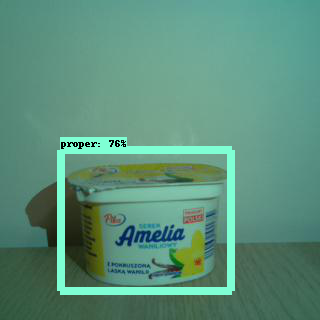

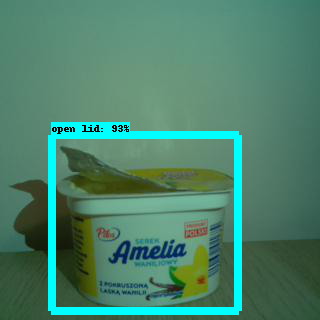

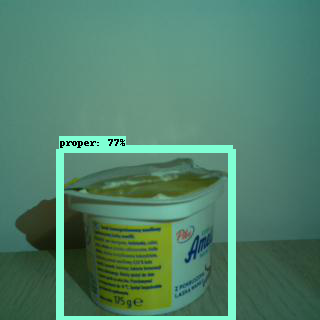

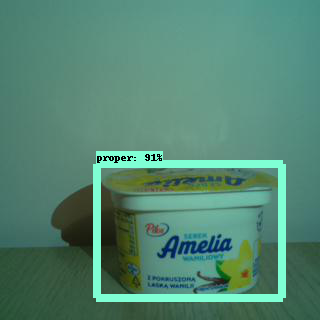

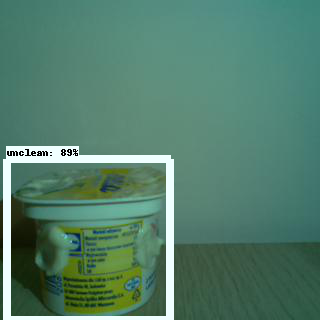

...

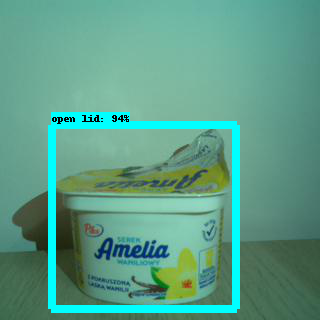

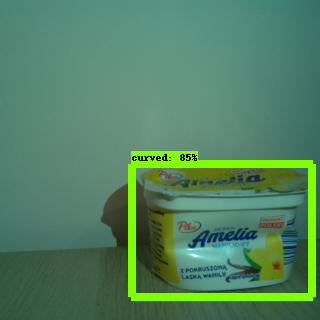

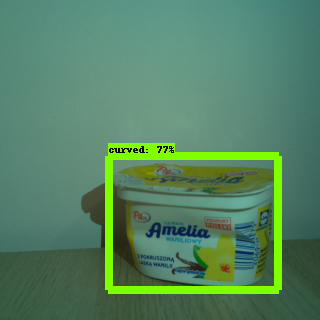

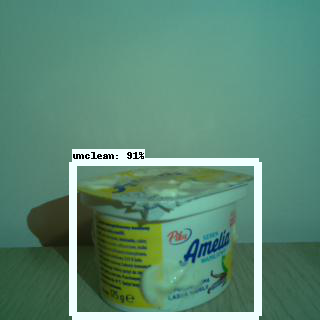

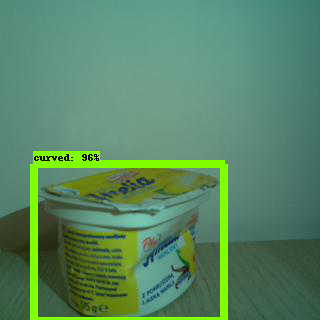

In [ ]:
for image_path in glob.glob('/content/gdrive/MyDrive/studia magisterskie/praca mag/test_cups/newest/*.jpg'):
  image_np = load_image_into_numpy_array(image_path)
  output_dict = run_inference_for_single_image(model, image_np)
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)
  display(Image.fromarray(image_np))

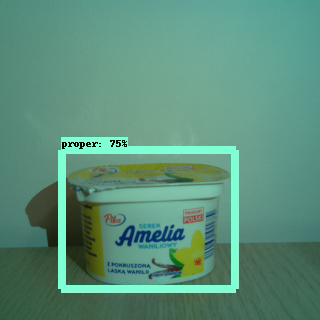

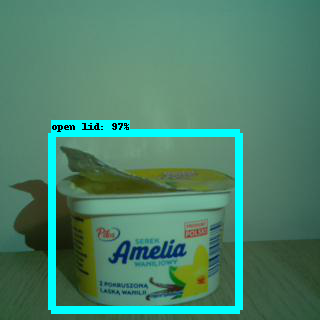

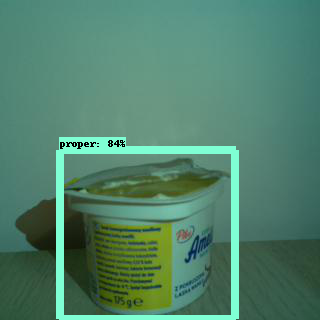

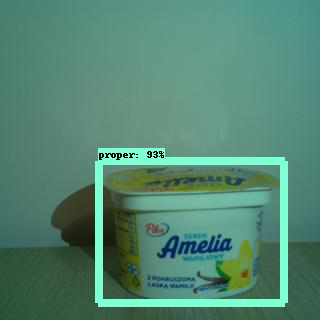

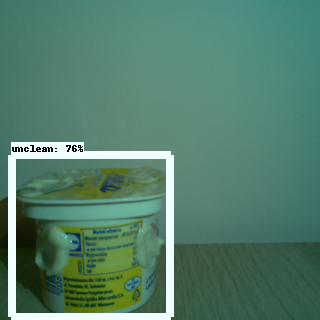

...

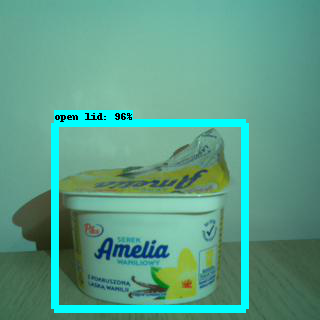

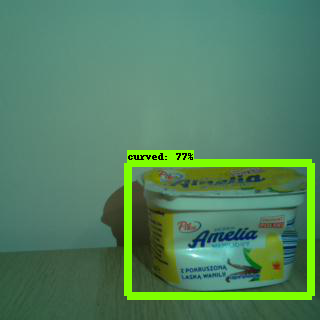

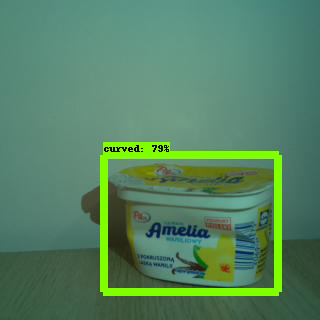

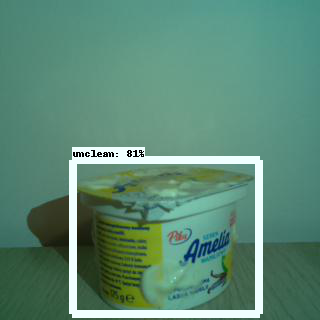

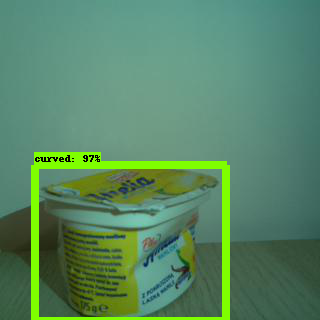

In [ ]:
for image_path in glob.glob('/content/gdrive/MyDrive/studia magisterskie/praca mag/test_cups/newest/*.jpg'):
  image_np = load_image_into_numpy_array(image_path)
  output_dict = run_inference_for_single_image(model, image_np)
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)
  display(Image.fromarray(image_np))

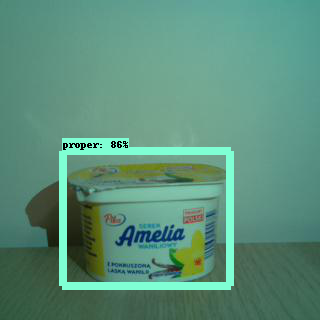

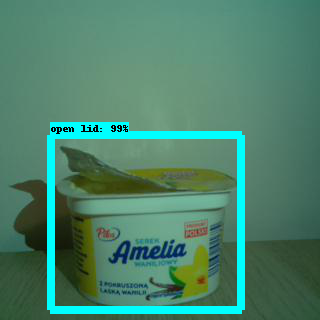

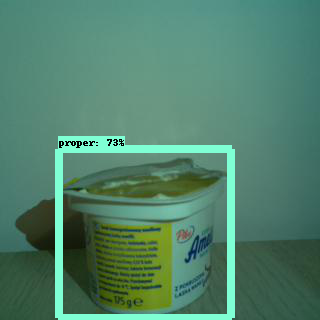

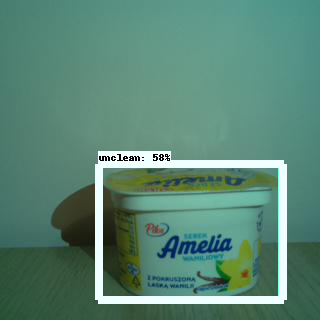

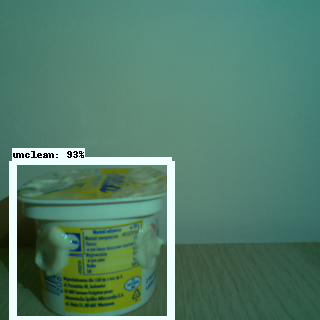

...

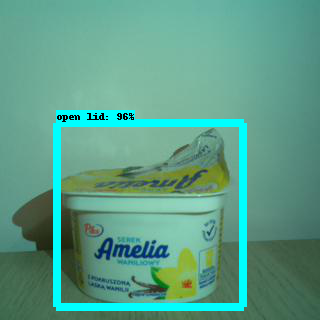

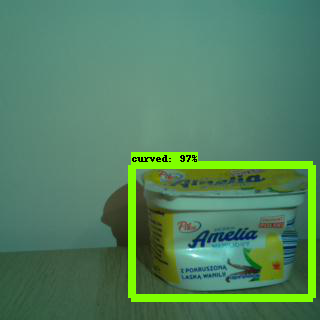

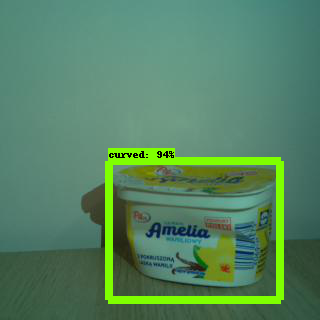

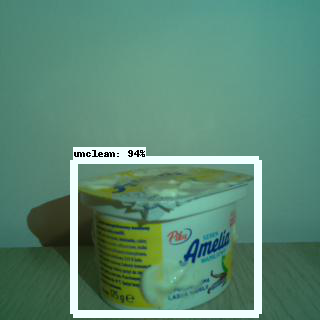

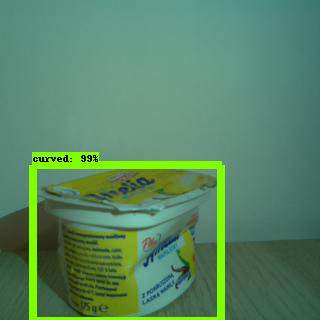

In [ ]:
for image_path in glob.glob('/content/gdrive/MyDrive/studia magisterskie/praca mag/test_cups/newest/*.jpg'):
  image_np = load_image_into_numpy_array(image_path)
  output_dict = run_inference_for_single_image(model, image_np)
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)
  display(Image.fromarray(image_np))